<a href="https://colab.research.google.com/github/Elisabeth-Engering/github-slideshow/blob/main/Data%20Understanding/MoveHouseBreda_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MoveHouseBreda

## Import Packages

In [1]:
!pip install --upgrade geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 27.8 MB/s 
     |████████████████████████████████| 6.3 MB 44.8 MB/s 
     |████████████████████████████████| 16.7 MB 489 kB/s 


In [2]:
!pip install --upgrade contextily

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 19.3 MB 1.2 MB/s 


In [3]:
!pip install --upgrade mapclassify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
# Import required packages
import pandas as pd
pd.set_option('display.max_columns', None) # Set pandas to display all columns
pd.set_option('display.max_rows', None) # Set pandas to display all rows

import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as ctx
import mapclassify

## Load Data

In [5]:
# Load the dataset
moves = gpd.read_file("/content/moves_grid_breda.gpkg")

In [6]:
moves.head()

,time_period,cbs_grid_code,moving_type,frequency,geometry
0,20132014,E1058N4018,Vertrek,2,"POLYGON ((4.67701 51.60383, 4.67846 51.60384, ..."
1,20132014,E1060N4020,Verhuizing,1,"POLYGON ((4.67987 51.60565, 4.68131 51.60566, ..."
2,20132014,E1061N4038,Verhuizing,1,"POLYGON ((4.68106 51.62184, 4.68251 51.62184, ..."
3,20132014,E1063N4015,Vertrek,1,"POLYGON ((4.68427 51.60118, 4.68571 51.60119, ..."
4,20132014,E1063N4017,Verhuizing,2,"POLYGON ((4.68424 51.60298, 4.68569 51.60299, ..."


## Basic Data Exploration


In this step, I performed the below operations to check what the data set comprises of.
1. Head of the DataFrame;
2. Shape of the DataFrame;
3. The shape of the DataFrame;
4. Info of the DataFrame.

In [17]:
# Display head of the DataFrame
moves.head()

,time_period,cbs_grid_code,moving_type,frequency,geometry
0,20132014,E1058N4018,Vertrek,2,"POLYGON ((4.67701 51.60383, 4.67846 51.60384, ..."
1,20132014,E1060N4020,Verhuizing,1,"POLYGON ((4.67987 51.60565, 4.68131 51.60566, ..."
2,20132014,E1061N4038,Verhuizing,1,"POLYGON ((4.68106 51.62184, 4.68251 51.62184, ..."
3,20132014,E1063N4015,Vertrek,1,"POLYGON ((4.68427 51.60118, 4.68571 51.60119, ..."
4,20132014,E1063N4017,Verhuizing,2,"POLYGON ((4.68424 51.60298, 4.68569 51.60299, ..."


In [18]:
# Display shape of the DataFrame
moves.shape

(39374, 5)

In [19]:
# Display information of the DataFrame
moves.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 39374 entries, 0 to 39373
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   time_period    39374 non-null  object  
 1   cbs_grid_code  39374 non-null  object  
 2   moving_type    39374 non-null  object  
 3   frequency      39374 non-null  int64   
 4   geometry       39374 non-null  geometry
dtypes: geometry(1), int64(1), object(3)
memory usage: 1.5+ MB


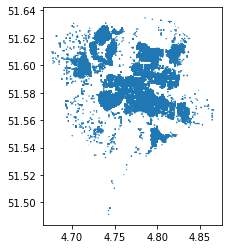

In [20]:
# Create basic plot
moves.plot()

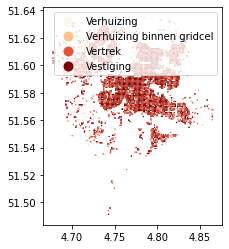

In [21]:
# Create plot with accurate legend
fig, ax = plt.subplots(1, 1)
moves.plot(column = "moving_type", ax = ax, legend = True, cmap='OrRd')

/usr/local/lib/python3.7/dist-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 29 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)


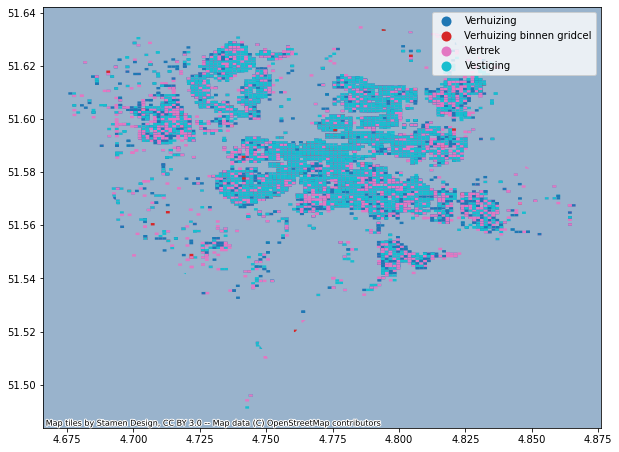

In [22]:
# Create plot with background map
ax = moves.plot(column = "moving_type", legend = True, figsize = (10, 15))
ctx.add_basemap(ax)
plt.show()

/usr/local/lib/python3.7/dist-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 29 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)


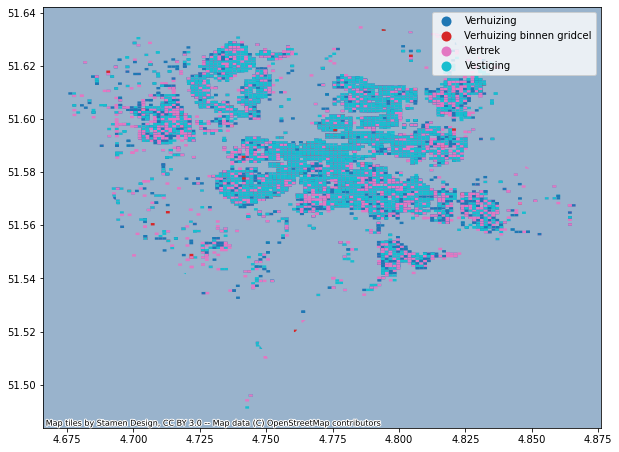

In [24]:
# Create plot with map background
moves.to_crs(epsg = 3857) # Ensure the data is in Spherical Mercator
ax = moves.plot(column="moving_type", legend=True, figsize=(10, 15))
ctx.add_basemap(ax)
plt.show()

In [25]:
# Create subsets
verhuizing = moves[moves["moving_type"] == "Verhuizing"]
verhuizing_binnen_gridcel = moves[moves["moving_type"] == "Verhuizing binnen gridcel"]
vertrek = moves[moves["moving_type"] == "Vertrek"]
vestiging = moves[moves["moving_type"] == "Vestiging"]

/usr/local/lib/python3.7/dist-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 29 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)


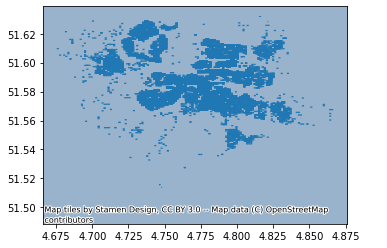

In [26]:
ax = verhuizing.plot(legend=True)
ctx.add_basemap(ax)
plt.show()

/usr/local/lib/python3.7/dist-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 30 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)


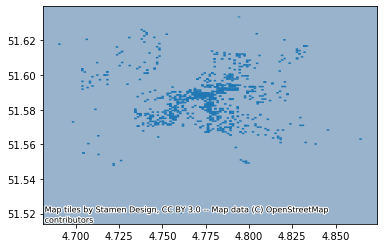

In [27]:
ax = verhuizing_binnen_gridcel.plot(legend=True)
ctx.add_basemap(ax)
plt.show()

/usr/local/lib/python3.7/dist-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 29 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)


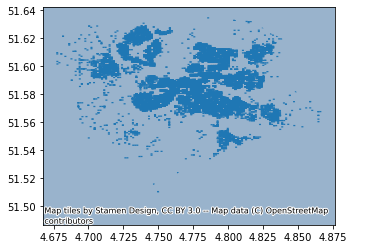

In [28]:
ax = vertrek.plot(legend=True)
ctx.add_basemap(ax)
plt.show()

/usr/local/lib/python3.7/dist-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 29 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)


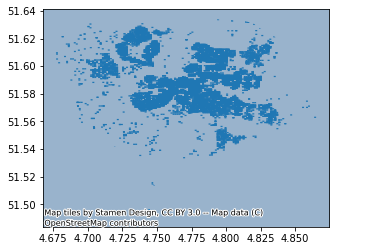

In [29]:
ax = vestiging.plot(legend=True)
ctx.add_basemap(ax)
plt.show()

## Data Quality Report

The parts of the quality report will include the following:
- Available columns
- For each column:
  - Data type
  - Count of missing values
  - Count of present values
  - Number of unique values
  - Minimum value
  - Maximum value

In [30]:
# Display availible columns
moves.columns 

Index(['time_period', 'cbs_grid_code', 'moving_type', 'frequency', 'geometry'], dtype='object')

In [31]:
# Display data type for each column
moves.dtypes 

time_period        object
cbs_grid_code      object
moving_type        object
frequency           int64
geometry         geometry
dtype: object

In [32]:
# Display count of missing values for each column
moves.isna().sum()

time_period      0
cbs_grid_code    0
moving_type      0
frequency        0
geometry         0
dtype: int64

In [33]:
# Display count of present values for each column
moves.count(0)

time_period      39374
cbs_grid_code    39374
moving_type      39374
frequency        39374
geometry         39374
dtype: int64

In [34]:
# Display minimum value for each column
moves.min()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  


time_period        20132014
cbs_grid_code    E1057N4025
moving_type      Verhuizing
frequency                 1
dtype: object

In [35]:
# Display maximum value for each column
moves.max()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  


time_period        20192020
cbs_grid_code    E1188N3977
moving_type       Vestiging
frequency               119
dtype: object

## Export

In [36]:
# Set CRS to a GeoDataFrame
move_house_breda = gpd.GeoDataFrame(moves, geometry = moves.geometry)
crs = move_house_breda.set_crs('epsg:4326')
move_house_breda

# Set area and lenght
move_house_breda['area'] = move_house_breda['geometry'].area # Create column with area data
move_house_breda['length'] = move_house_breda['geometry'].length # Create column with lenght data

# Create subset
move_house_breda.drop(columns = ["time_period",	"cbs_grid_code", "moving_type",	"frequency"]) # Drop rows

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  


,geometry,area,length
0,"POLYGON ((4.67701 51.60383, 4.67846 51.60384, ...",1.297412e-06,0.004685
1,"POLYGON ((4.67987 51.60565, 4.68131 51.60566, ...",1.297464e-06,0.004685
2,"POLYGON ((4.68106 51.62184, 4.68251 51.62184, ...",1.297926e-06,0.004686
3,"POLYGON ((4.68427 51.60118, 4.68571 51.60119, ...",1.297337e-06,0.004684
4,"POLYGON ((4.68424 51.60298, 4.68569 51.60299, ...",1.297388e-06,0.004685
5,"POLYGON ((4.68403 51.61646, 4.68548 51.61647, ...",1.297773e-06,0.004685
6,"POLYGON ((4.68551 51.61467, 4.68695 51.61468, ...",1.297722e-06,0.004685
7,"POLYGON ((4.68549 51.61557, 4.68694 51.61558, ...",1.297748e-06,0.004685
8,"POLYGON ((4.68732 51.59041, 4.68877 51.59042, ...",1.297031e-06,0.004684
9,"POLYGON ((4.68732 51.59041, 4.68877 51.59042, ...",1.297031e-06,0.004684


In [37]:
# Export file as GeoJSON
move_house_breda.to_file("/content/move_house_breda.geojson", driver='GeoJSON')